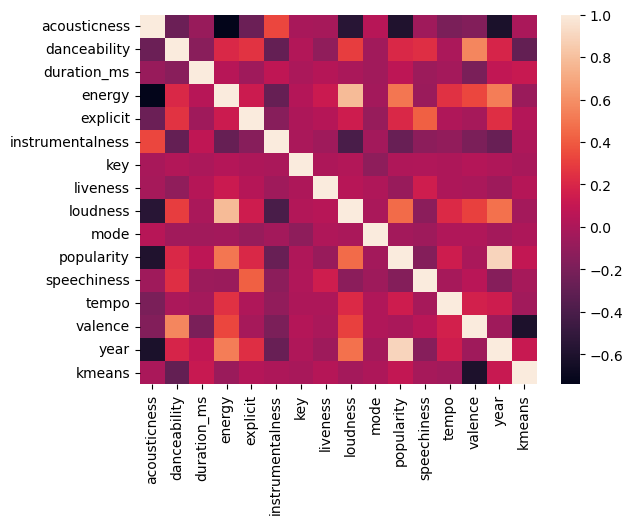

In [2]:


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
df=pd.read_csv('data.csv')
df.head()



df.drop_duplicates(inplace=True,subset=['name'])

name=df['name']



from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler

col_features = ['danceability', 'energy', 'valence', 'loudness']
X = MinMaxScaler().fit_transform(df[col_features])
kmeans = KMeans(init="k-means++",
                n_clusters=5,
                random_state=15).fit(X)
df['kmeans'] = kmeans.labels_
cluster=df.groupby(by=df['kmeans'])



df

df = df.drop(columns = ['id','artists'])



df.head()

df = df.dropna()

!pip install lightgbm
from lightgbm import LGBMClassifier


df.head()



import plotly.graph_objects as go
fig = go.Figure()
fig.add_trace(go.Box(y=df['acousticness'],name='Acousticness'))
fig.add_trace(go.Box(y=df['energy'],name='Energy'))
fig.add_trace(go.Box(y=df['danceability'],name='Danceability'))
fig.add_trace(go.Box(y=df['liveness'],name='liveness'))
fig.show()

import seaborn as sns
corrMatrix=df.corr()
sns.heatmap(corrMatrix)
plt.show()


df

iqr1 = df['acousticness'].quantile(0.25)
iqr3 = df['acousticness'].quantile(0.75)

iqr = iqr3-iqr1

upper_limit = iqr3 + 1.5 * iqr
lower_limit = iqr1 - 1.5 * iqr
df['acousticness'] = np.where(
    df['acousticness'] > upper_limit,
    upper_limit,
    np.where(
        df['acousticness'] < lower_limit,
        lower_limit,
        df['acousticness']
    )
)
iqr1 = df['energy'].quantile(0.25)
iqr3 = df['energy'].quantile(0.75)

iqr = iqr3-iqr1

upper_limit = iqr3 + 1.5 * iqr
lower_limit = iqr1 - 1.5 * iqr
df['energy'] = np.where(
    df['energy'] > upper_limit,
    upper_limit,
    np.where(
        df['energy'] < lower_limit,
        lower_limit,
        df['energy']
    )
)
iqr1 = df['danceability'].quantile(0.25)
iqr3 = df['danceability'].quantile(0.75)

iqr = iqr3-iqr1

upper_limit = iqr3 + 1.5 * iqr
lower_limit = iqr1 - 1.5 * iqr
df['danceability'] = np.where(
    df['danceability'] > upper_limit,
    upper_limit,
    np.where(
        df['danceability'] < lower_limit,
        lower_limit,
        df['danceability']
    )
)
iqr1 = df['liveness'].quantile(0.25)
iqr3 = df['liveness'].quantile(0.75)

iqr = iqr3-iqr1

upper_limit = iqr3 + 1.5 * iqr
lower_limit = iqr1 - 1.5 * iqr
df['liveness'] = np.where(
    df['liveness'] > upper_limit,
    upper_limit,
    np.where(
        df['liveness'] < lower_limit,
        lower_limit,
        df['liveness']
    )
)

df.shape

cols = set()
corr_matrix = df.corr()
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i,j]) > 0.7:
            colname = corr_matrix.columns[i]
            cols.add(colname)
           

In [3]:
new_df1 = df[df['kmeans']==0].reset_index()
new_df2 = df[df['kmeans']==1].reset_index()
new_df3 = df[df['kmeans']==2].reset_index()
new_df4= df[df['kmeans']==3].reset_index()
new_df5 = df[df['kmeans']==4].reset_index()

In [4]:
ndf = pd.DataFrame(columns = df.columns)

In [5]:
df
   

,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,valence,year,kmeans
0,0.9950,0.708,158648,0.1950,0,0.563000,10,0.1510,-12.428,1,Singende Bataillone 1. Teil,0,1928,0.0506,118.469,0.7790,1928,0
1,0.9940,0.379,282133,0.0135,0,0.901000,8,0.0763,-28.454,1,"Fantasiestücke, Op. 111: Più tosto lento",0,1928,0.0462,83.972,0.0767,1928,2
2,0.6040,0.749,104300,0.2200,0,0.000000,5,0.1190,-19.924,0,Chapter 1.18 - Zamek kaniowski,0,1928,0.9290,107.177,0.8800,1928,0
3,0.9950,0.781,180760,0.1300,0,0.887000,1,0.1110,-14.734,0,Bebamos Juntos - Instrumental (Remasterizado),0,1928-09-25,0.0926,108.003,0.7200,1928,0
4,0.9900,0.210,687733,0.2040,0,0.908000,11,0.0980,-16.829,1,"Polonaise-Fantaisie in A-Flat Major, Op. 61",1,1928,0.0424,62.149,0.0693,1928,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
169901,0.2640,0.744,167845,0.7020,1,0.000000,7,0.1200,-6.255,0,Letter To Nipsey (feat. Roddy Ricch),66,2020-01-27,0.2880,91.885,0.3380,2020,3
169903,0.2100,0.795,218501,0.5850,0,0.000001,8,0.1120,-4.451,1,Ojos De Maniaco,68,2020-02-28,0.0374,97.479,0.9340,2020,1
169904,0.1730,0.875,163800,0.4430,1,0.000032,1,0.0891,-7.461,1,Skechers (feat. Tyga) - Remix,75,2020-05-15,0.1430,100.012,0.3060,2020,4
169905,0.0167,0.719,167468,0.3850,0,0.031300,8,0.1110,-10.907,1,Sweeter (feat. Terrace Martin),64,2020-06-08,0.0403,128.000,0.2700,2020,4


In [6]:
for i in range(2000,len(new_df1)):
    new_df1 = new_df1.drop(i)

In [ ]:
df

In [8]:
y = df['kmeans']
x = df.drop(columns = ['name','release_date','kmeans'])
x = x.drop(columns=['year'])


from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.25)

In [9]:
model=LGBMClassifier().fit(x_train,y_train)

In [10]:
model.score(x_train,y_train)

0.99995988165087

In [11]:
model.score(x_test,y_test)

0.9904919512562058

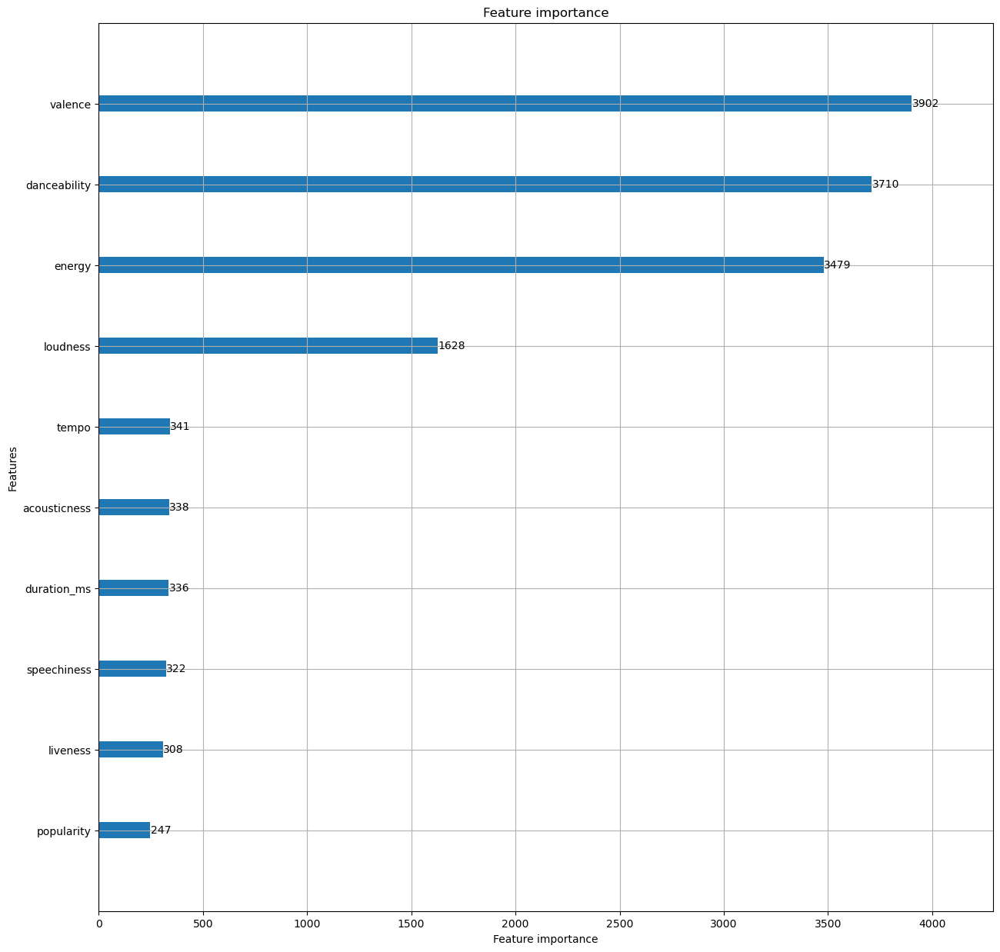

In [12]:
import lightgbm
import matplotlib.pyplot as plt
ax = lightgbm.plot_importance(model, max_num_features=10, figsize=(15,15))
plt.show()

In [13]:
emotion_model_path = 'final_model3.h5'

In [14]:
cluster=df.groupby(by=df['kmeans'])

In [15]:
df=cluster.apply(lambda x: x.sort_values(["popularity"],ascending=False))
df.reset_index(level=0, inplace=True,drop=True)

In [16]:
def get_results(emotion_code):
  NUM_RECOMMEND=10
  happy_set=[]
  sad_set=[]
  if emotion_code==0:#neutral
      happy_set.append(df[df['kmeans']==0]['name'].head(NUM_RECOMMEND))
      return pd.DataFrame(happy_set).T
  elif emotion_code==1:#happy
      sad_set.append(df[df['kmeans']==1]['name'].head(NUM_RECOMMEND))
      return pd.DataFrame(sad_set).T
  elif emotion_code==2:#sad
        sad_set.append(df[df['kmeans']==2]['name'].head(NUM_RECOMMEND))
        return pd.DataFrame(sad_set).T
  elif emotion_code==3:#surprise
        sad_set.append(df[df['kmeans']==3]['name'].head(NUM_RECOMMEND))
        return pd.DataFrame(sad_set).T
  else:#angry
        sad_set.append(df[df['kmeans']==4]['name'].head(NUM_RECOMMEND))
        return pd.DataFrame(sad_set).T

In [19]:
get_results(1)#emotion:-happy

,name
87844,Supalonely
87952,Rain On Me (with Ariana Grande)
87858,Dance Monkey
87850,Don't Start Now
87977,Safaera
87970,Yo Perreo Sola
87944,WHATS POPPIN
87969,Boss Bitch
87947,Savage Remix (feat. Beyoncé)
87909,Tusa


In [ ]:
happy
sad
neutral
angry
surprise

In [ ]:
get_results(0)

In [ ]:
import pickle
file = open('recommend.pkl','wb')
pickle.dump(df,file)